In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, SpectralNormMLP

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Target Distribution

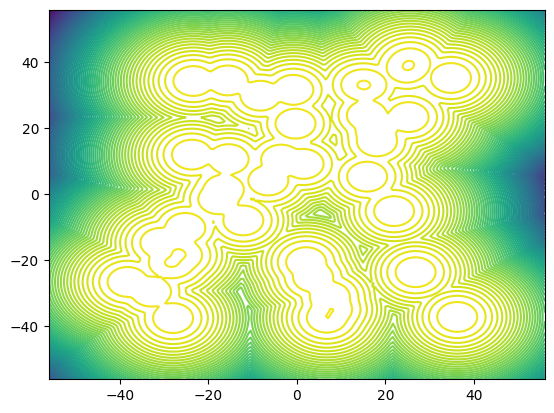

In [4]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0


if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

### Helper Functions

In [5]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

   
    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")

    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [6]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''
    mins = -50 #torch.min(x, dim=0)[0]
    maxs = 50 #torch.max(x, dim=0)[0]
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

## Function Definitions

### Estimated Reward Functions

In [7]:
# calculate the log expectation of the reward
def log_E_R(_x, _t, beta, num_mc_samples, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = (repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) 
                   + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5))
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [8]:
def estimated_Rt(x, t, beta, num_mc_samples=100, var_exploding=True):
    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None))(x, t, beta, 
                                                                       num_mc_samples, var_exploding=var_exploding)

In [9]:
def estimate_grad_Rt(x, t, beta, num_mc_samples=200, var_exploding=True, richardson=False):
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples, 
                                                                                  var_exploding=var_exploding)
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

### True Reward Functions

In [10]:
def true_Rt(x, t, beta, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * t
    target.convolve(h_t * (global_maxs **2), t, var_exploding=var_exploding)
    energy = target.log_prob(unnormalize(x, global_mins, global_maxs))
    target.reset()
    return energy

In [11]:
def true_grad_Rt(x, t, beta, var_exploding=True):
    samples_energy = true_Rt(x, t[0], beta, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
    return true_scores

## SDE Tests

### Dataset

In [12]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/_tensor.py:738: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(


In [13]:
# normalize the dataset
init_num_samples = 2048
unnorm_true_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

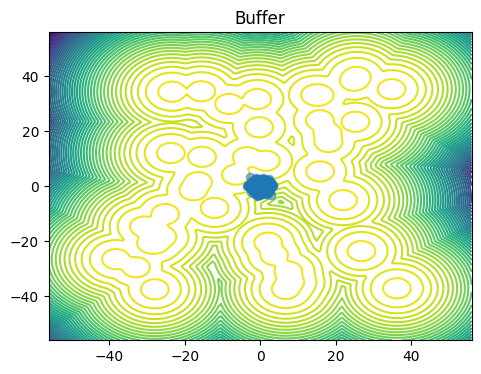

In [14]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### VE SDE

In [15]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score, beta):
        super().__init__()
        self.score = score
        self.beta = beta
    
    def f(self, t, x):
        with torch.enable_grad():
            if t.dim() == 0:
                # repeat the same time for all points if we have a scalar time
                t = t * torch.ones(x.shape[0]).to(device)

            x.requires_grad = True
            score = self.score(x, 1-t, self.beta)
        return self.g(t, x)**2 * score 
    
    def g(self, t, x):
        return torch.full_like(x, self.beta ** 0.5)

In [16]:
def generate_samples(ve_reverse_sde, x_init):
    t = torch.linspace(0.001, 1.0, 500).to(device)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x_init, t)
    return samples

In [17]:
def euler_maruyama_step(sde, x, t, dt):
    # Calculate drift and diffusion terms
    drift = sde.f(t, x) * dt
    diffusion = sde.g(t, x) * np.sqrt(dt) * torch.randn_like(x).to(device)

    # Update the state
    x_next = x + drift + diffusion
    return x_next, drift

def integrate_sde(sde, x0, t_span, dt):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    pred_v = []
    true_v = []
    samples = []
    with torch.no_grad():
        for t in times:
            x, f = euler_maruyama_step(sde, x, t, dt)
            samples.append(x)
            pred_v.append(f)
            # true_v.append(true_grad_Rt(x, 1-t, beta))
    return torch.stack(samples), torch.stack(pred_v) # , torch.stack(true_v)

In [18]:
num_samples = 512
beta = 0.2

with torch.no_grad():
    target.convolve(torch.tensor(beta*50**2, device=torch.device('cpu')), 1)
    x1_samples = target.sample((num_samples,))
    target.reset()
    x1_samples_normalized = normalize(x1_samples)[0]

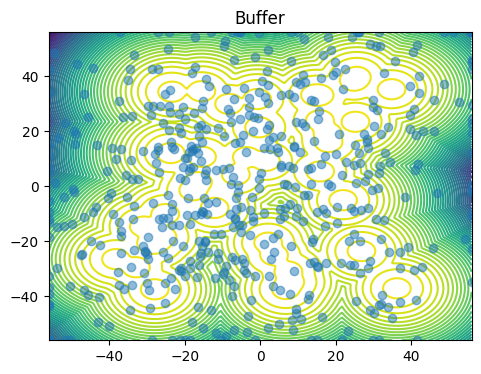

[<Figure size 1200x400 with 1 Axes>]

In [19]:
plot_dataset(x1_samples)

In [20]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
ve_reverse_sde = VEReverseSDE(estimate_grad_Rt, beta)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
samples, pred_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

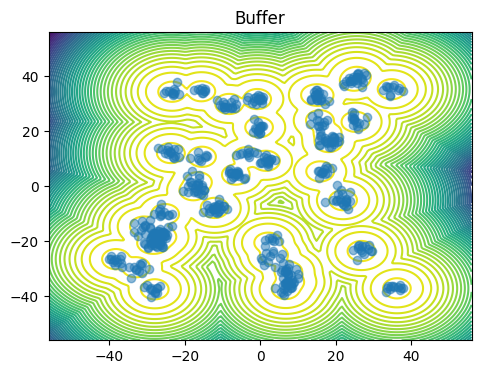

[<Figure size 1200x400 with 1 Axes>]

In [21]:
plot_dataset(unnormalize(samples[-1], global_mins_init, global_maxs_init))

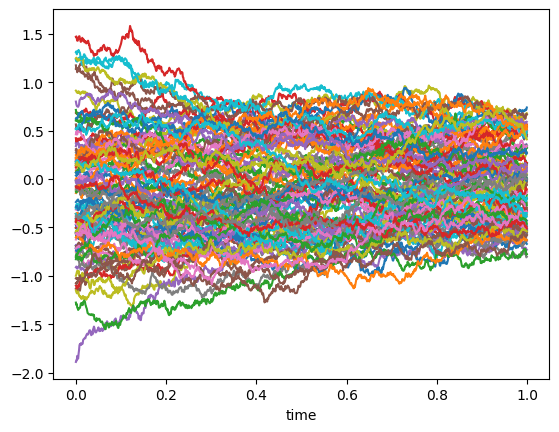

In [22]:
plt.plot(torch.arange(0, 1, 0.001), samples[:, :100, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [23]:
ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
true_samples, true_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

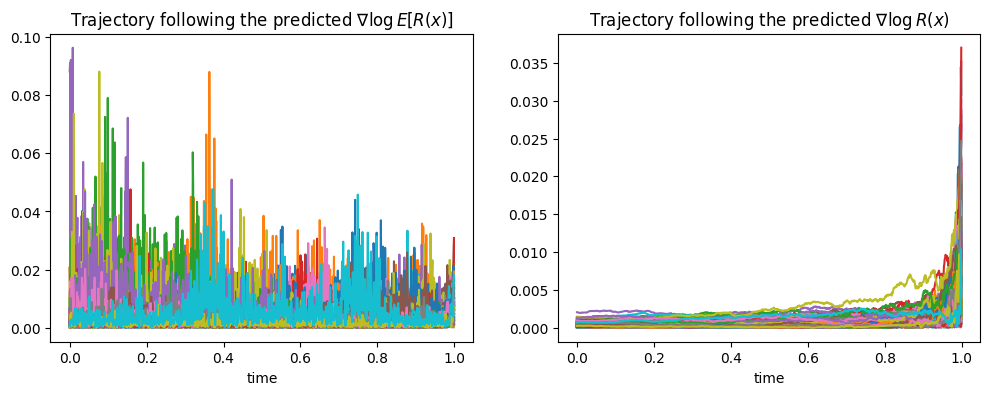

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# predicted 
traj_pred = torch.cumsum(pred_vectors, dim=-1)
axs[0].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_pred[:,:200], dim=-1).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
traj_true = torch.cumsum(true_vectors, dim=-1)
axs[1].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_true[:,:200], dim=-1).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the predicted $\nabla \log R(x)$")

plt.show()

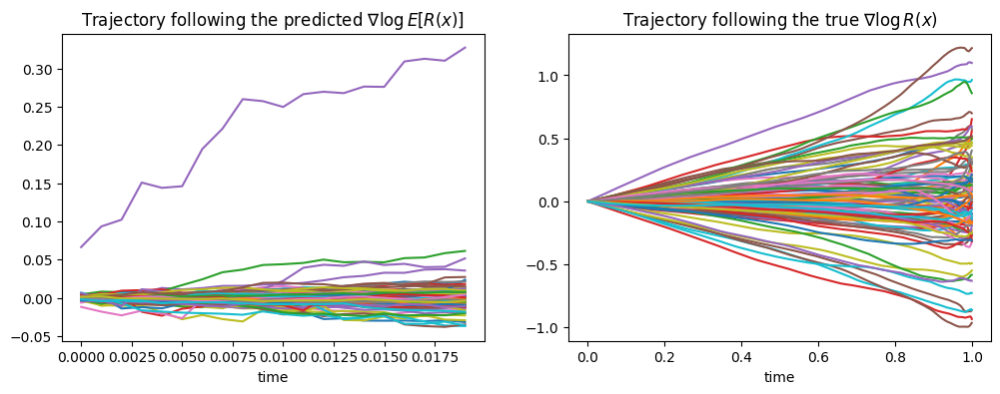

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# predicted 
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_pred, dim=0).cpu())
axs[0].plot(torch.arange(0, 1, 0.001)[:20], torch.cumsum(pred_vectors[:20, :100, 0], dim=0).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_true, dim=0).cpu())
axs[1].plot(torch.arange(0, 1, 0.001), torch.cumsum(true_vectors[:, :100, 0], dim=0).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the true $\nabla \log R(x)$")

plt.show()

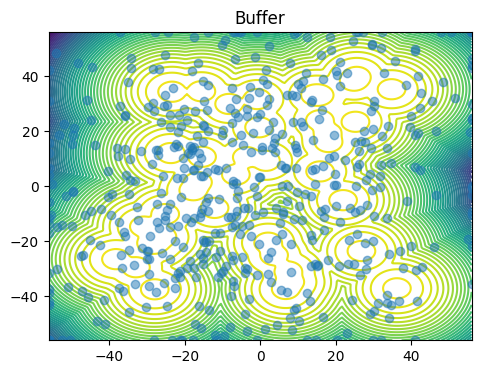

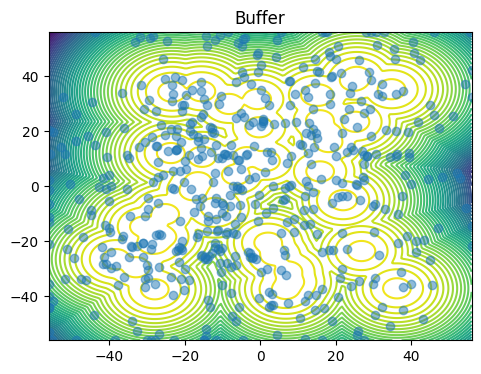

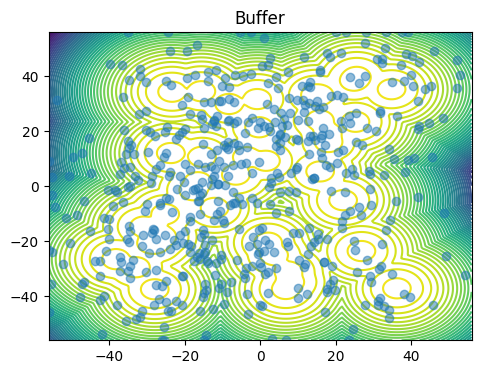

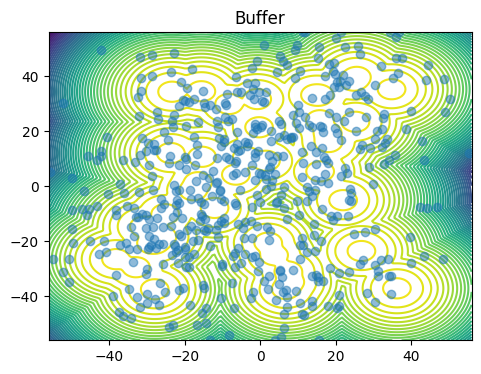

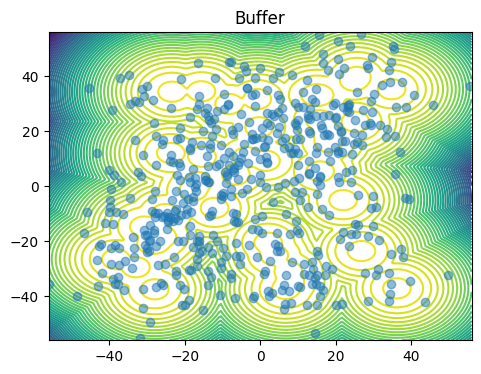

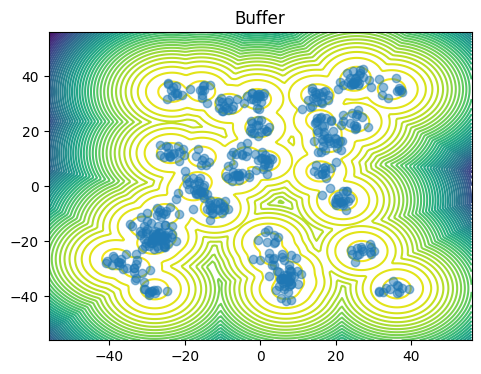

In [26]:
for i in range(0, samples.shape[0], 199):
    plot_dataset(unnormalize(samples[i], global_mins_init, global_maxs_init))

### Training

In [42]:
def reward_matching_loss_biased(vectorfield, x, t, beta):     
    h_t = beta * t.unsqueeze(1)
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t ** 0.5)
    pred_scores = vectorfield(noisy_x, t)

    estimated_scores = estimate_grad_Rt(noisy_x, t, beta)
    norm = torch.linalg.vector_norm(estimated_scores, dim=-1)
    #print(norm.max())
    max_norm = 100
    clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
    estimated_scores = estimated_scores #* clip_coef.unsqueeze(-1)
    

    return ((estimated_scores - pred_scores)**2).mean()

In [43]:
def score_loss(vectorfield, x, t):
    h_t = beta * t.unsqueeze(1)
    # x(t)
    x_t = torch.normal(x, h_t ** 0.5)
    s_pred = vectorfield(x_t, t)

    s_true = - (x_t - x)/ h_t 
    return ((s_pred - s_true)**2).mean()    

In [44]:
beta = 0.2
vectorfield = MyMLP().to(device)
opt_vectorfield = Adam(vectorfield.parameters(), lr=1e-4)

In [45]:
# buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
#                       device=device, fill_buffer_during_init=False, sample_with_replacement=True)
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, 
                      sample_with_replacement=True, prioritize=True)

# x1_energy = target.log_prob(x1_samples).detach()
# buffer.add(x1_samples_normalized, x1_energy)
buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


In [46]:
outer_epochs= 100
inner_epochs = 100

num_samples = 2048 

#train_dataset = TensorDataset(x1_samples_normalized.clone(), x1_energy.clone())
train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 1091.681885


Epoch 49 | Loss 582.961304
Epoch 98 | Loss 687.535889


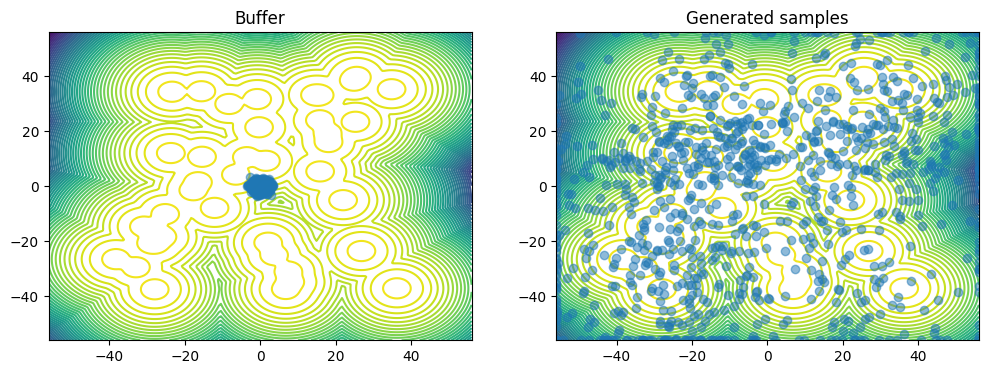

  1%|          | 1/100 [00:20<33:53, 20.54s/it]

Epoch 0 | Loss 148.323059
Epoch 49 | Loss 135.900848
Epoch 98 | Loss 96.812042


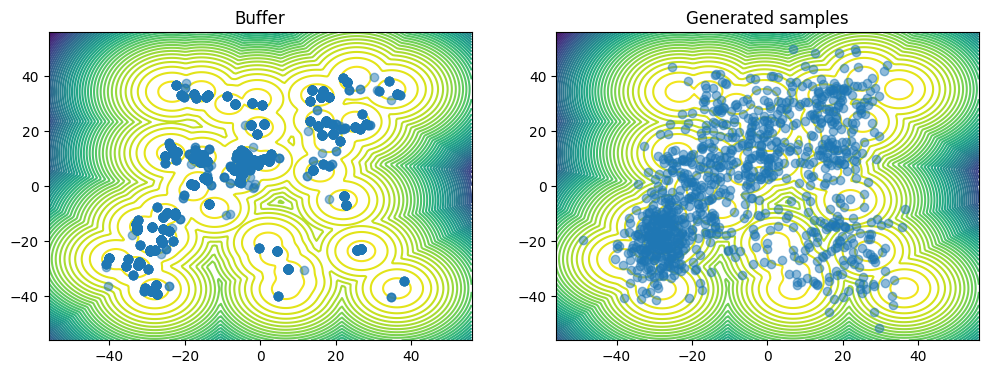

  2%|▏         | 2/100 [00:49<41:39, 25.51s/it]

Epoch 0 | Loss 96.092255
Epoch 49 | Loss 627.693604
Epoch 98 | Loss 99.185760


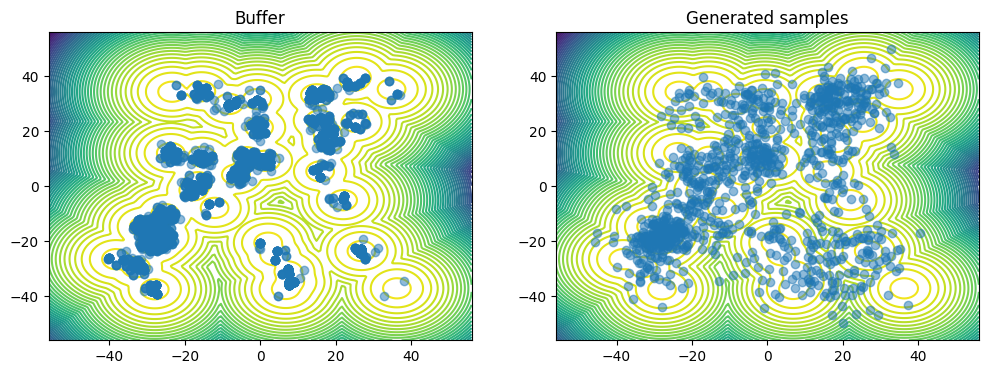

  3%|▎         | 3/100 [01:18<43:54, 27.16s/it]

Epoch 0 | Loss 88.012619
Epoch 49 | Loss 83.202759
Epoch 98 | Loss 78.830261


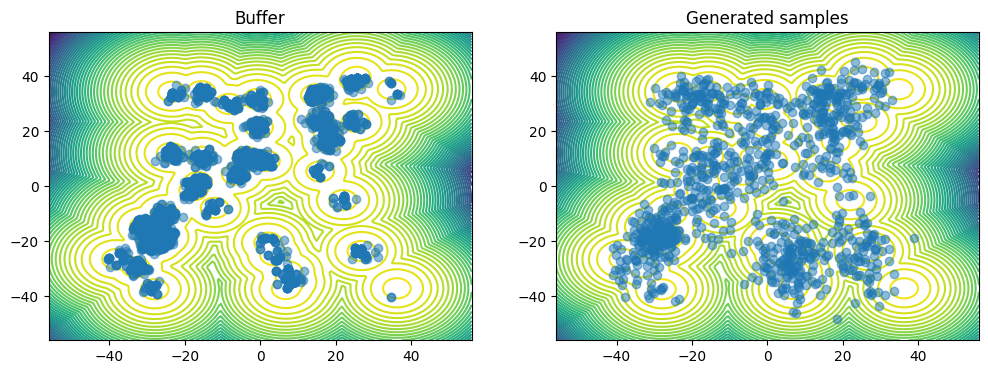

  4%|▍         | 4/100 [01:48<44:56, 28.09s/it]

Epoch 0 | Loss 74.294601
Epoch 49 | Loss 88.630669
Epoch 98 | Loss 84.775360


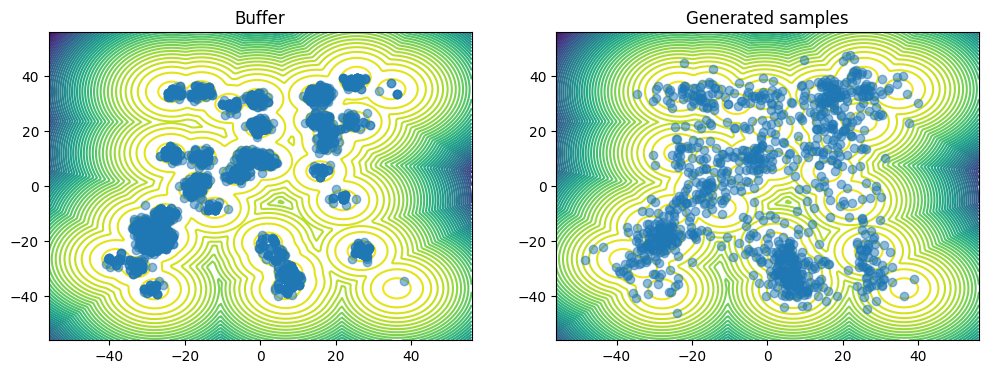

  5%|▌         | 5/100 [02:17<45:07, 28.51s/it]

Epoch 0 | Loss 81.481400
Epoch 49 | Loss 92.973412
Epoch 98 | Loss 77.630188


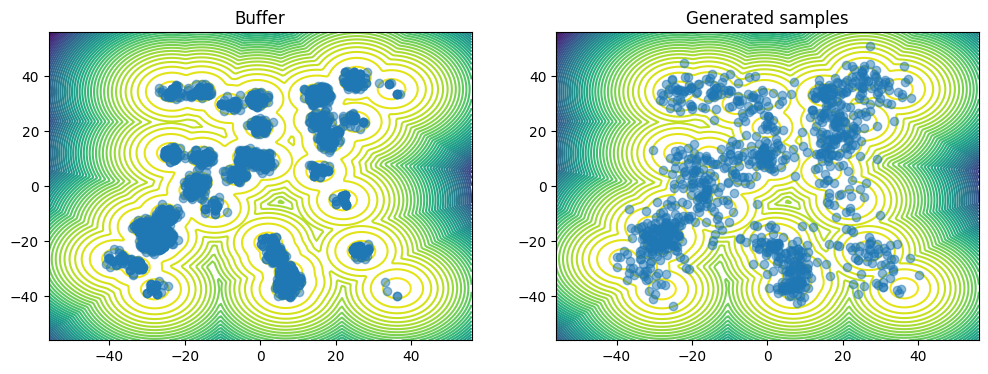

  6%|▌         | 6/100 [02:46<45:13, 28.86s/it]

Epoch 0 | Loss 120.329369
Epoch 49 | Loss 91.315262
Epoch 98 | Loss 194.835739


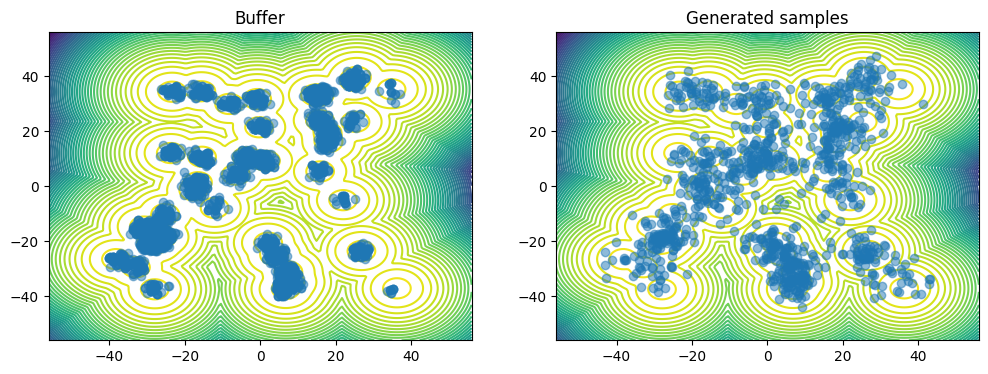

  7%|▋         | 7/100 [03:16<44:58, 29.02s/it]

Epoch 0 | Loss 72.453331
Epoch 49 | Loss 82.069000
Epoch 98 | Loss 74.078758


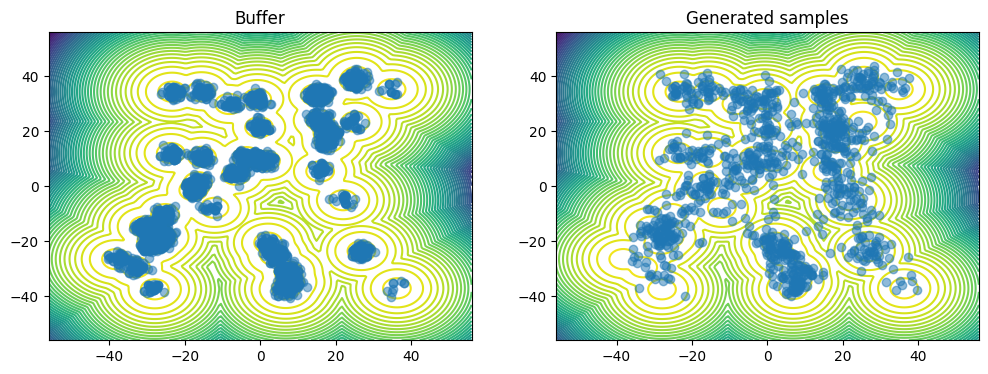

  8%|▊         | 8/100 [03:45<44:43, 29.16s/it]

Epoch 0 | Loss 73.134254
Epoch 49 | Loss 73.748428
Epoch 98 | Loss 98.035370


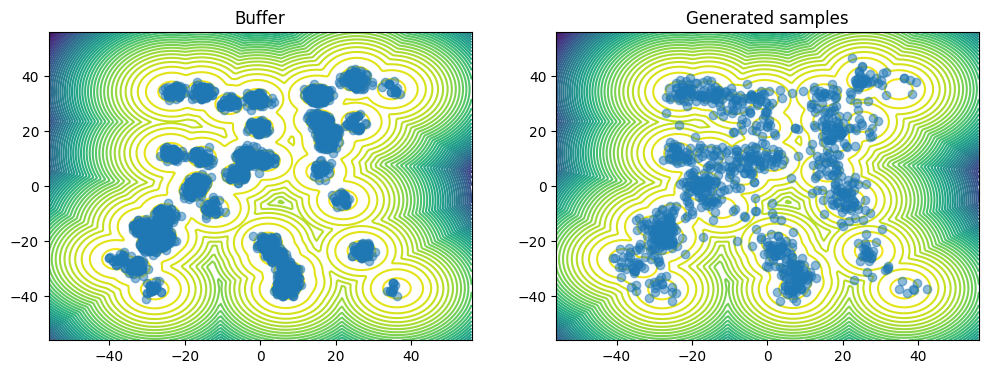

  9%|▉         | 9/100 [04:15<44:17, 29.20s/it]

Epoch 0 | Loss 87.827209
Epoch 49 | Loss 130.759903
Epoch 98 | Loss 70.928429


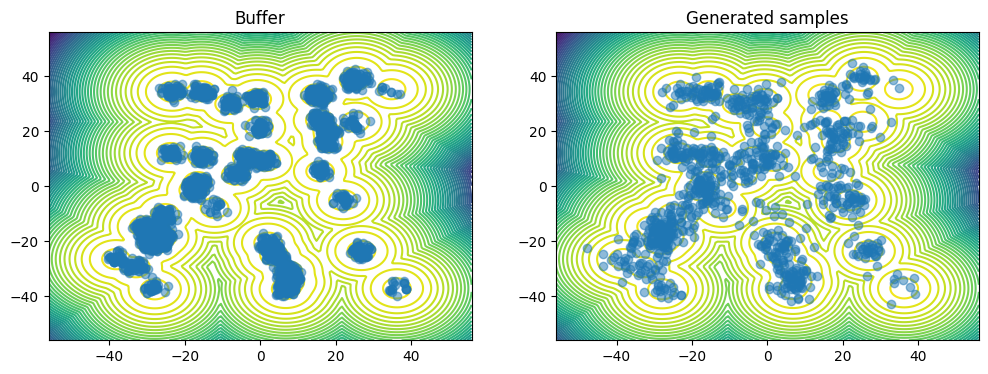

 10%|█         | 10/100 [04:44<43:54, 29.27s/it]

Epoch 0 | Loss 57.962273
Epoch 49 | Loss 66.374878
Epoch 98 | Loss 134.721893


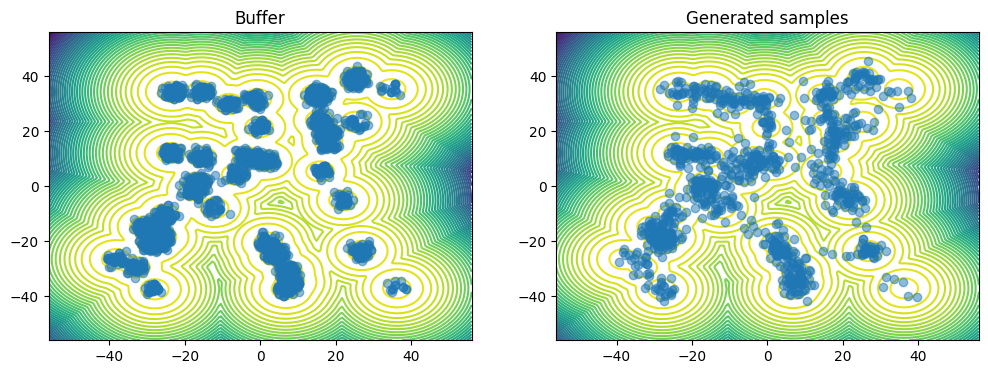

 11%|█         | 11/100 [05:13<43:30, 29.33s/it]

Epoch 0 | Loss 102.287735
Epoch 49 | Loss 83.734253
Epoch 98 | Loss 74.754166


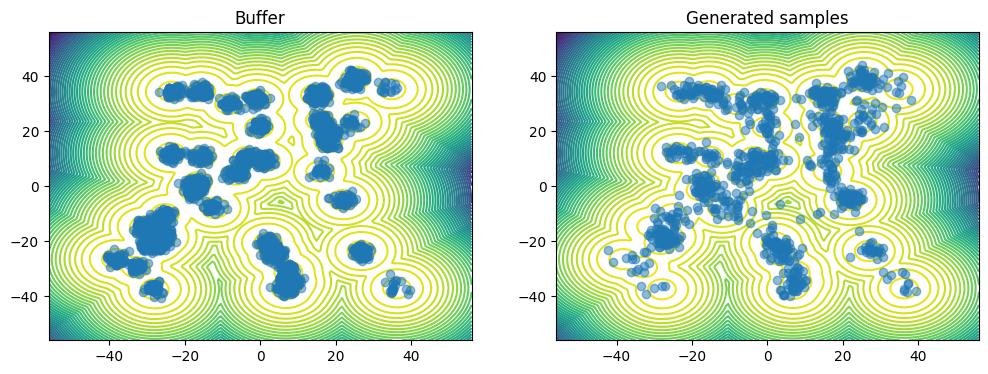

 12%|█▏        | 12/100 [05:43<43:03, 29.35s/it]

Epoch 0 | Loss 200.317123
Epoch 49 | Loss 209.182465
Epoch 98 | Loss 55.976036


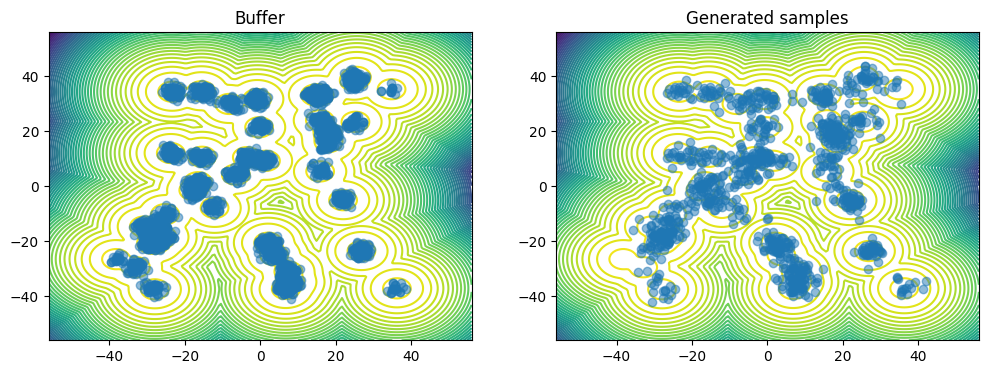

 13%|█▎        | 13/100 [06:13<42:45, 29.49s/it]

Epoch 0 | Loss 185.682495
Epoch 49 | Loss 53.934692
Epoch 98 | Loss 75.955917


 13%|█▎        | 13/100 [06:28<43:23, 29.92s/it]


KeyboardInterrupt: 

In [47]:
for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()

            # t = torch.rand(len(samples), device=device)
            # 80 % sample from (0, 0.1), 20% sample from (0.1, 1)
            # x0 is data
            low_time_t = (-0.1 * torch.rand(len(samples), device=device)) + 0.1
            high_time_t = (-0.9 * torch.rand(len(samples), device=device)) + 1.0
            mask = torch.rand(len(samples), device=device) < 0.8   
            t = (low_time_t * mask) + (high_time_t * ~mask)

            loss = reward_matching_loss_biased(vectorfield, samples, t, beta) # score_loss(vectorfield, samples, t)
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the network
    ve_reverse_sde = VEReverseSDE(vectorfield, beta)
    x1_samples = (torch.randn((1000, dim), device=device) * np.sqrt(beta)).to(device)
    samples = generate_samples(ve_reverse_sde, x1_samples)[-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

    # Update Buffer 
    buffer.add(samples, samples_energy)

    plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                 unnormalize(samples, global_mins, global_maxs))
    plt.show()
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

### Evaluation

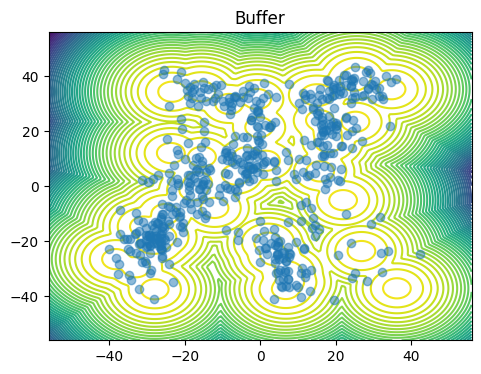

[<Figure size 1200x400 with 1 Axes>]

In [28]:
samples = generate_samples(ve_reverse_sde, x1_samples_normalized)[-1]
plot_dataset(unnormalize(samples, global_mins, global_maxs))

In [29]:
from torch.func import jacrev

In [30]:
follow_estimate = False
follow_true = False
follow_model = True

In [31]:
def drift(x, t):
    with torch.enable_grad():
        x.requires_grad = True
        if follow_estimate:
            f = -0.5 * beta * estimate_grad_Rt(x, t, beta, num_mc_samples=100)
            norm = torch.linalg.vector_norm(f, dim=-1)
            #print(norm.max())
            max_norm = 200
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f * clip_coef.unsqueeze(-1)
        elif follow_true:
            f = - 0.5 * beta * true_grad_Rt(x, t, beta)
        elif follow_model:
            f = - 0.5 * beta * vectorfield(x, t)
            norm = torch.linalg.vector_norm(f, dim=-1)
            # print("norm", norm.max())
            max_norm = 10
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f  * clip_coef.unsqueeze(-1)
            # print("clipped norm", torch.linalg.vector_norm(f, dim=-1).max())
    return f

In [32]:
def div_fn(u):
    """Accepts a function u:R^D -> R^D."""
    J = jacrev(u)
    def div(x):
        return torch.trace(J(x.unsqueeze(0)).squeeze())
    return div

def output_and_div(vecfield, x):
    if follow_estimate:
        dx = torch.vmap(vecfield, randomness="different")(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    elif follow_true:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x.clone().detach().requires_grad_(True))
    elif follow_model:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    return dx, div

In [33]:
def prior_dist(beta):
    dist = torch.distributions.MultivariateNormal(
        torch.zeros(2).to(device), torch.eye(2).to(device) * beta
    )
    return dist

In [34]:
reverse_time = False

In [35]:
unnorm_test_samples = target.sample((init_num_samples,)).to(device).detach()

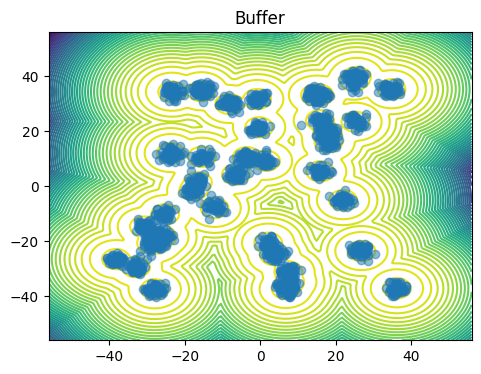

[<Figure size 1200x400 with 1 Axes>]

In [36]:
plot_dataset(unnorm_test_samples)

In [37]:
def odefunc(t, x_in):
    x = x_in[..., :-1].clone().detach().requires_grad_(True)
    t = t.to(device)
    vecfield = lambda x: drift(x, t)
    if follow_model:
        def vecfield(x):
            return drift(x, torch.ones(x.shape[0]).to(device) * t)
    dx, div = output_and_div(vecfield, x)
    div = div.reshape(-1, 1)
    return torch.cat([dx, div], dim=-1)

with torch.no_grad():
    if reverse_time:
        x1 = torch.randn(1024, 2).to(device) * np.sqrt(beta)
        time = torch.linspace(1, 0, 1000).to(device)
    else:
        x1, _, _ = normalize(unnorm_test_samples)
        time = torch.linspace(0, 1, 1000).to(device)
    state1 = torch.cat([x1, torch.zeros_like(x1[..., :1])], dim=-1)
    state1.requires_grad = True
    state0 = odeint(odefunc, state1, t=time, method="euler")[-1]

    x0, logdetjac = state0[..., :-1], state0[..., -1]
    p0 = prior_dist(beta)
    logp0 = p0.log_prob(x0)
    logp1 = -(logp0 + logdetjac)

In [38]:
print("logp0", logp0.mean())
print("logdetjac", logdetjac.mean())
print("logp1", logp1.mean())

logp0 tensor(-11.8540, device='cuda:0')
logdetjac tensor(3.4640, device='cuda:0')
logp1 tensor(8.3900, device='cuda:0')


In [39]:
log_p0_true = true_Rt(prior_samples, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

NameError: name 'prior_samples' is not defined

In [ ]:
log_p0_true = true_Rt(x0, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

logp0 true:  tensor(-14.6749, device='cuda:0')


In [40]:
-(log_p0_true + logdetjac).mean()

NameError: name 'log_p0_true' is not defined

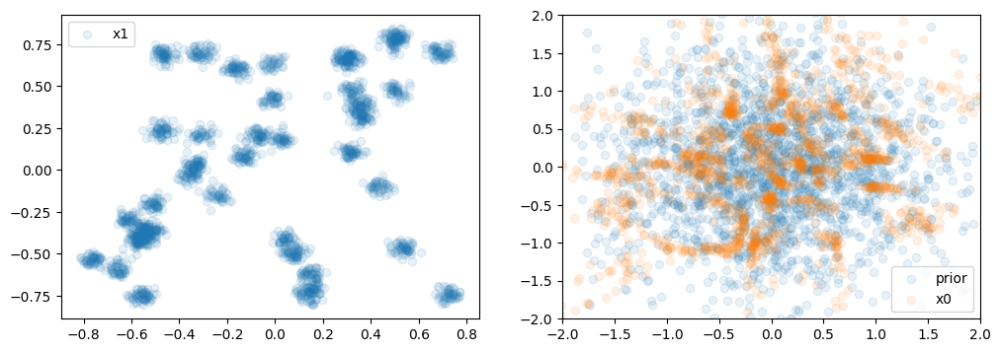

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].scatter(x1[:, 0].detach().cpu(), x1[:, 1].detach().cpu(), alpha=0.1, label="x1")

prior_samples = p0.sample((2048,))
if reverse_time:
    ax[0].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.2, label="prior")
    ax[1].scatter(samples[:, 0].detach().cpu(), samples[:, 1].detach().cpu(), alpha=0.1, label="generated samples")
else:
    ax[1].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.1, label="prior")
ax[0].legend()

ax[1].scatter(x0[:, 0].detach().cpu(), x0[:, 1].detach().cpu(), alpha=0.1, label="x0")
ax[1].legend()
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()

In [131]:
logp1.mean()

tensor(1.4928, device='cuda:0')